<a href="https://colab.research.google.com/github/H4miiiid/Image_Classification_Unibo_IPCV/blob/main/assignment_module_two.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Environment Setup and Imports

This cell installs the required libraries in Google Colab and imports all modules needed for the project, including PyTorch, torchvision, NumPy, Matplotlib, and tqdm. It also sets random seeds for reproducibility and selects the appropriate device (GPU or CPU) for training.


In [ ]:
# Install required libraries in Google Colab (PyTorch, torchvision, matplotlib, tqdm)
!pip install -q torch torchvision matplotlib tqdm
!pip install torchsummary
# Import Python built-in libraries
import os
import random
import time
from collections import defaultdict
from pathlib import Path
import pandas as pd

# Import scientific and visualization tools
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Import PyTorch core modules
import torch
import torch.nn as nn
import torch.optim as optim
from torchsummary import summary

# Import PyTorch utilities for datasets & data loading
from torch.utils.data import DataLoader, random_split, Subset

# Import torchvision: image transforms, pretrained models, datasets
from torchvision import transforms, models, datasets

# reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# Import torchvision: image transforms, pretrained models, datasets
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Import warnings to ignore the warnings
import warnings
warnings.filterwarnings("ignore")

# Device selection: use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


### Download Oxford-IIIT Pet Dataset

This cell downloads the Oxford-IIIT Pet dataset using torchvision's built-in dataset class. It creates a local data folder, fetches all images and annotations, and prints the total number of samples. Each item in the dataset consists of an image and its corresponding class label.


In [ ]:
# This uses torchvision's OxfordIIITPet dataset class to download the dataset.
from torchvision.datasets import OxfordIIITPet

root = "./data"
os.makedirs(root, exist_ok=True)

# Download dataset (images + annotations)
dataset_all = OxfordIIITPet(root=root, download=True, target_types="category")
print("Total items:", len(dataset_all))

100%|██████████| 792M/792M [00:36<00:00, 21.7MB/s]
100%|██████████| 19.2M/19.2M [00:01<00:00, 11.6MB/s]


Total items: 3680


### Showing all the labels and the names and also checking some random images and their labels

In [ ]:
idx_to_class = {v: k for k, v in dataset_all.class_to_idx.items()}

for idx in range(len(idx_to_class)):
    print(idx, "->", idx_to_class[idx])

0 -> Abyssinian
1 -> American Bulldog
2 -> American Pit Bull Terrier
3 -> Basset Hound
4 -> Beagle
5 -> Bengal
6 -> Birman
7 -> Bombay
8 -> Boxer
9 -> British Shorthair
10 -> Chihuahua
11 -> Egyptian Mau
12 -> English Cocker Spaniel
13 -> English Setter
14 -> German Shorthaired
15 -> Great Pyrenees
16 -> Havanese
17 -> Japanese Chin
18 -> Keeshond
19 -> Leonberger
20 -> Maine Coon
21 -> Miniature Pinscher
22 -> Newfoundland
23 -> Persian
24 -> Pomeranian
25 -> Pug
26 -> Ragdoll
27 -> Russian Blue
28 -> Saint Bernard
29 -> Samoyed
30 -> Scottish Terrier
31 -> Shiba Inu
32 -> Siamese
33 -> Sphynx
34 -> Staffordshire Bull Terrier
35 -> Wheaten Terrier
36 -> Yorkshire Terrier


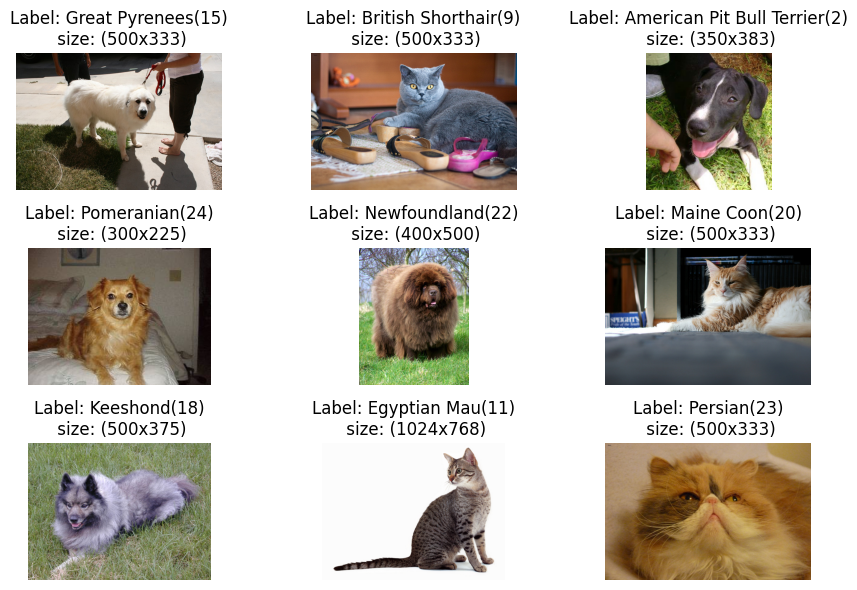

In [ ]:
indices = random.sample(range(len(dataset_all)), 9)

fig, axes = plt.subplots(3, 3, figsize=(9, 6))
axes = axes.flatten()

for ax, idx in zip(axes, indices):
    img, label = dataset_all[idx]
    class_name = dataset_all.classes[label]
    w, h = img.size
    ax.imshow(img)
    ax.set_title(f"Label: {class_name}({label})\n size: ({w}x{h})")
    ax.axis("off")

plt.tight_layout()
plt.show()

**NOTE:** The original images have different sizes, but CNNs require a fixed input size. We therefore apply transforms to resize/crop all images to the same shape and use data augmentation (random crops, flips, color jitter) to improve robustness and accuracy.

### Data Preprocessing, Transformations, and Dataloaders

This cell prepares all preprocessing steps and dataloaders for the project. It defines image transforms (augmentations for training and clean transforms for validation/testing), wraps the dataset to apply transforms dynamically, splits the data into train/validation/test sets, and creates PyTorch DataLoaders to efficiently feed batches to the model during training.



In [ ]:
# Input size we will use for all models
IMG_SIZE = 224
BATCH_SIZE = 64
NUM_WORKERS = 2
NUM_CLASSES = len(dataset_all.classes)

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])


# We'll create a dataset wrapper that applies transforms on-the-fly
class TransformDataset(torch.utils.data.Dataset):
    def __init__(self, base_dataset, transform=None):
        self.base = base_dataset   # original dataset (images + labels)
        self.transform = transform   # transform to apply

    def __len__(self):
        return len(self.base)   # number of samples


    def __getitem__(self, idx):
        img, label = self.base[idx]   # get image and label
        if self.transform is not None:
            img = self.transform(img)   # apply transform if provided
        return img, label                   # return processed image and label

full_dataset = TransformDataset(dataset_all, transform=None)  # transform applied later by Subset wrappers

# Train / Validation / Test Splits
n = len(full_dataset)    # total dataset size
train_n = int(0.8 * n)   # 80% for training
val_n = int(0.1 * n)     # 10% for validation
test_n = n - train_n - val_n   # remaining 10% for testing

# Randomly split dataset into train/val/test indices (but reproducible with seed)
train_idx, val_idx, test_idx = torch.utils.data.random_split(list(range(n)), [train_n, val_n, test_n], generator=torch.Generator().manual_seed(SEED))

# Create datasets with transforms
train_dataset = Subset(TransformDataset(dataset_all, transform=train_transform), train_idx.indices)
val_dataset   = Subset(TransformDataset(dataset_all, transform=test_transform), val_idx.indices)
test_dataset  = Subset(TransformDataset(dataset_all, transform=test_transform), test_idx.indices)

# DataLoaders– create batches and feed data to the model
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print("Train / Val / Test sizes:", len(train_dataset), len(val_dataset), len(test_dataset))


Train / Val / Test sizes: 2944 368 368


### Training Utilities: Accuracy, Training Loop, Evaluation Loop, and Plotting

This cell defines the core helper functions used during model training. It includes:
- an accuracy function to measure classification performance,
- a `train_one_epoch` function that performs a single epoch of training,
- an `evaluate` function for computing validation/test metrics without gradient updates,
- and a plotting function to visualize training and validation loss/accuracy curves.


In [ ]:
# Accuracy helper: computes classification accuracy in a batch
def accuracy(preds, labels):
    return (preds.argmax(dim=1) == labels).float().mean().item()


# Train the model for ONE epoch
def train_one_epoch(model, loader, loss_fn, optimizer, device):
    model.train()            # set model to training mode (enables dropout, BN updates)
    running_loss = 0.0       # accumulate total loss over epoch
    running_acc = 0.0        # accumulate number of correct predictions
    n = 0                    # total number of samples seen

     # loop over all batches in the data loader
    for imgs, labels in loader:
        imgs = imgs.to(device)   # move data to CPU/GPU
        labels = labels.to(device)
        optimizer.zero_grad()     # reset gradients from previous step
        outputs = model(imgs)        # forward pass: compute model outputs
        loss = loss_fn(outputs, labels)      # compute loss between outputs and true labels
        loss.backward()                    # backpropagate gradients
        optimizer.step()                  # update model parameters
        bs = imgs.size(0)                  # batch size (number of images in this batch)

        # accumulate loss * batch_size (for correct averaging later)
        running_loss += loss.item() * bs
        # count correctly predicted samples in this batch
        running_acc += (outputs.argmax(1) == labels).sum().item()
        # update total number of samples seen
        n += bs
    # return average loss and accuracy over the whole epoch
    return running_loss / n, running_acc / n


# Evaluation loop (no gradient update)
def evaluate(
    model,
    loader,
    loss_fn,
    device,
    show_examples: bool = False,
    class_names=None,
    num_examples: int = 6,
    inv_norm=None,
):
    model.eval()
    running_loss = 0.0
    running_acc = 0.0
    n = 0  # total number of samples seen

    # For random example collection
    example_images = []
    example_labels = []
    example_preds  = []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            outputs = model(imgs)                 # forward pass only
            loss = loss_fn(outputs, labels)       # compute loss
            preds = outputs.argmax(1)

            bs = imgs.size(0)

            # Accumulate metrics
            running_loss += loss.item() * bs
            running_acc  += (preds == labels).sum().item()

            # Randomly sample examples for visualization (reservoir sampling)
            if show_examples:
                for i in range(bs):
                    # global index of this sample in the whole dataset
                    if len(example_images) < num_examples:
                        # still filling the reservoir
                        example_images.append(imgs[i].detach().cpu())
                        example_labels.append(labels[i].item())
                        example_preds.append(preds[i].item())
                    else:
                        # decide randomly whether to replace an existing slot
                        j = random.randint(0, n + i)
                        if j < num_examples:
                            example_images[j] = imgs[i].detach().cpu()
                            example_labels[j] = labels[i].item()
                            example_preds[j] = preds[i].item()

            n += bs

    avg_loss = running_loss / n
    avg_acc  = running_acc / n

    # ---- Plot examples if requested ----
    if show_examples and len(example_images) > 0 and class_names is not None:
        rows = 2
        cols = (num_examples + 1) // 2  # e.g. 6 -> 3 columns
        plt.figure(figsize=(4 * cols, 4 * rows))

        for idx, (img, true_idx, pred_idx) in enumerate(
            zip(example_images, example_labels, example_preds)
        ):
            if idx >= num_examples:
                break

            # undo normalization if provided
            if inv_norm is not None:
                img = inv_norm(img)
            img = torch.clamp(img, 0.0, 1.0)

            true_label = class_names[true_idx]
            pred_label = class_names[pred_idx]
            correct = (true_idx == pred_idx)
            color = "green" if correct else "red"

            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img.permute(1, 2, 0))  # C,H,W -> H,W,C
            plt.title(f"True: {true_label}\nPred: {pred_label}",
                      color=color, fontsize=9)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

    return avg_loss, avg_acc



# Plot the accuracy and loss for training and validation sets
def plot_curves(history, title="Training"):
    train_loss = history['train_loss']
    val_loss   = history['val_loss']
    train_acc  = history['train_acc']
    val_acc    = history['val_acc']

    epochs = np.arange(1, len(train_loss) + 1)

    # Best validation loss (min) and accuracy (max)
    best_val_loss = min(val_loss)
    best_val_loss_epoch = val_loss.index(best_val_loss) + 1

    best_val_acc = max(val_acc)
    best_val_acc_epoch = val_acc.index(best_val_acc) + 1

    plt.figure(figsize=(10, 4))

    # ---- Left plot: loss ----
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='train_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    # mark best val loss
    plt.scatter(best_val_loss_epoch, best_val_loss, color='red', zorder=5)
    plt.text(best_val_loss_epoch, best_val_loss,
             f"  best={best_val_loss:.3f}",
             va='center', fontsize=8)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(title + " Loss")
    plt.legend()

    # ---- Right plot: accuracy ----
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc, label='train_acc')
    plt.plot(epochs, val_acc, label='val_acc')
    # mark best val acc
    plt.scatter(best_val_acc_epoch, best_val_acc, color='red', zorder=5)
    plt.text(best_val_acc_epoch, best_val_acc,
             f"  best={best_val_acc:.3f}",
             va='center', fontsize=8)
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title(title + " Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Print best values below the plots
    print(f"Best val_loss: {best_val_loss:.4f} at epoch {best_val_loss_epoch}")
    print(f"Best val_acc : {best_val_acc:.4f} at epoch {best_val_acc_epoch}")



We save all the models inside the *all_models* to compare all the models at the end.

In [ ]:
all_models = {}

### Base CNN Model (PetCNNBaseline)

First, we define a baseline CNN model with 32 base channels. The network has two convolutional blocks, and each block contains a 3×3 convolution layer, batch normalization, a ReLU activation, and a 2×2 max pooling layer. After these blocks, we apply global average pooling and a final linear layer to predict the 37 classes. This compact baseline model has a total of 21,989 trainable parameters.

In [ ]:
class PetCNNBaseline(nn.Module):
    def __init__(self, num_classes: int = 37, base_channels: int = 32, dropout: float= 0.3):
        super().__init__()

        # Block 1: 3 -> base_channels
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=3,
                      out_channels=base_channels,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(base_channels),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2)   # H, W / 2
        )

        # Block 2: base_channels -> base_channels * 2
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(in_channels=base_channels,
                      out_channels=base_channels * 2,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(base_channels * 2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2)   # H, W / 2
        )

        # Classifier
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=(1, 1)),  # (B, C, H, W) -> (B, C, 1, 1)
            nn.Flatten(),                              # (B, C, 1, 1) -> (B, C)
            nn.Dropout(p=dropout),
            nn.Linear(in_features=base_channels * 2,
                      out_features=num_classes)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.classifier(x)
        return x


In [ ]:
model_base = PetCNNBaseline(num_classes=len(dataset_all.classes)).to(device)
summary(model_base, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             896
       BatchNorm2d-2         [-1, 32, 224, 224]              64
              ReLU-3         [-1, 32, 224, 224]               0
         MaxPool2d-4         [-1, 32, 112, 112]               0
            Conv2d-5         [-1, 64, 112, 112]          18,496
       BatchNorm2d-6         [-1, 64, 112, 112]             128
              ReLU-7         [-1, 64, 112, 112]               0
         MaxPool2d-8           [-1, 64, 56, 56]               0
 AdaptiveAvgPool2d-9             [-1, 64, 1, 1]               0
          Flatten-10                   [-1, 64]               0
          Dropout-11                   [-1, 64]               0
           Linear-12                   [-1, 37]           2,405
Total params: 21,989
Trainable params: 21,989
Non-trainable params: 0
---------------------------------

## Training and Validation Loop

We first train and validate our baseline CNN model for 40 epochs, monitoring both the loss and accuracy. Afterwards, we focus on optimizing the CNN architecture and improving the training loop to achieve better performance.

In [ ]:
EPOCHS = 30
LR = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE = 7
USE_AMP = torch.cuda.is_available()
GRAD_CLIP = 1.0

def run_training(model, epochs=EPOCHS, lr=LR, save_name=None):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=WEIGHT_DECAY)

    # OneCycleLR: needs steps_per_epoch
    steps_per_epoch = len(train_loader)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=lr*10, epochs=epochs, steps_per_epoch=steps_per_epoch,
        pct_start=0.1, div_factor=10.0, final_div_factor=100.0
    )

    scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_acc, best_state, patience = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        t0 = time.time()
        # ---- train ----
        model.train()
        run_loss = 0.0
        run_correct = 0
        n = 0
        for imgs, labels in train_loader:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=USE_AMP):
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)

            scaler.scale(loss).backward()
            if GRAD_CLIP:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            bs = imgs.size(0)
            run_loss += loss.item() * bs
            run_correct += (outputs.argmax(1) == labels).sum().item()
            n += bs

        train_loss = run_loss / n
        train_acc = run_correct / n

        # ---- val ----
        model.eval()
        v_loss = 0.0
        v_correct = 0
        v_n = 0
        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)
                bs = imgs.size(0)
                v_loss += loss.item() * bs
                v_correct += (outputs.argmax(1) == labels).sum().item()
                v_n += bs
        val_loss = v_loss / v_n
        val_acc = v_correct / v_n

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)

        improved = val_acc > best_val_acc + 1e-4
        if improved:
            best_val_acc = val_acc
            patience = 0
            best_state = {k: v.detach().cpu() for k, v in model.state_dict().items()}
            if save_name:
                torch.save(best_state, save_name)
        else:
            patience += 1

        print(f"Epoch {epoch}/{epochs}  time {(time.time()-t0):.1f}s  "
              f"train_loss {train_loss:.4f} train_acc {train_acc:.4f}  "
              f"val_loss {val_loss:.4f} val_acc {val_acc:.4f}  "
              f"{'(best)' if improved else ''}")

        if patience >= PATIENCE:
            print(f"Early stopping (best val_acc={best_val_acc:.4f})")
            break

    if best_state:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})
    return model, history, best_val_acc


In [ ]:
file_name = "baseline_cnn_adam.pt"
baseline_model_adam = PetCNNBaseline(num_classes= len(dataset_all.classes))
baseline_model_adam, baseline_history_adam, baseline_val_acc_adam = run_training(
    baseline_model_adam, save_name= file_name
)
print(f"Best val accuracy: {baseline_val_acc_adam * 100:.2f}")

Epoch 1/30  time 20.7s  train_loss 3.6281 train_acc 0.0377  val_loss 3.5571 val_acc 0.0734  (best)
Epoch 2/30  time 21.7s  train_loss 3.5687 train_acc 0.0571  val_loss 3.5407 val_acc 0.0462  
Epoch 3/30  time 22.8s  train_loss 3.5469 train_acc 0.0598  val_loss 3.4849 val_acc 0.0815  (best)
Epoch 4/30  time 20.5s  train_loss 3.5117 train_acc 0.0618  val_loss 3.4793 val_acc 0.0761  
Epoch 5/30  time 21.7s  train_loss 3.4800 train_acc 0.0774  val_loss 3.4419 val_acc 0.0707  
Epoch 6/30  time 21.1s  train_loss 3.4630 train_acc 0.0771  val_loss 3.4137 val_acc 0.1005  (best)
Epoch 7/30  time 20.4s  train_loss 3.4387 train_acc 0.0822  val_loss 3.4764 val_acc 0.0679  
Epoch 8/30  time 21.2s  train_loss 3.4292 train_acc 0.0904  val_loss 3.3728 val_acc 0.1196  (best)
Epoch 9/30  time 21.3s  train_loss 3.4301 train_acc 0.0954  val_loss 3.3957 val_acc 0.1087  
Epoch 10/30  time 20.5s  train_loss 3.4005 train_acc 0.0978  val_loss 3.3658 val_acc 0.1114  
Epoch 11/30  time 21.0s  train_loss 3.3996 tr

## Visualizing the training and loss procedure over the epochs

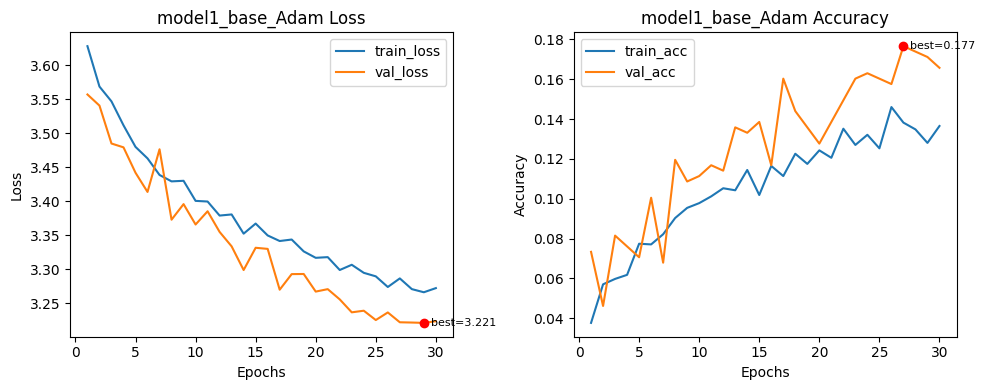

Best val_loss: 3.2210 at epoch 29
Best val_acc : 0.1766 at epoch 27


In [ ]:
plot_curves(baseline_history_adam, title= "model1_base_Adam")

**NOTE:** As we can see in the plots the base model could only reach the 17% validation accuracy after 30 epochs training which shows that the CNN model that we created is very simple.

## Evaluating the base model over test set

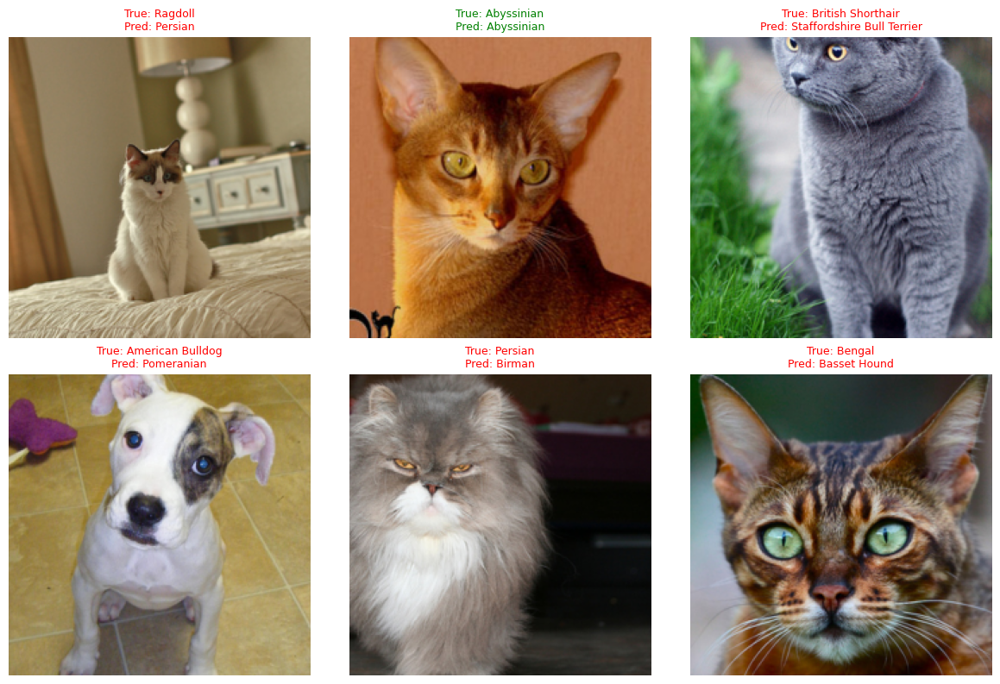


Base CNN model with Adam optimizer --> Test loss: 3.1834, Test accuracy: 14.13%


In [ ]:
# inverse normalization for ImageNet stats
inv_norm = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225],
)

loss_fn = nn.CrossEntropyLoss()
test_loss_base, test_acc_base = evaluate(baseline_model_adam, test_loader, loss_fn, device, show_examples=True, class_names=dataset_all.classes, num_examples=6, inv_norm=inv_norm)
print(f"\nBase CNN model with Adam optimizer --> Test loss: {test_loss_base:.4f}, Test accuracy: {test_acc_base * 100:.2f}%")

**!NOTE:** Only 14% accuracy over test set. Try to improve this accuracy over next steps. Also for understanding better the accuracy we showed some examples with their True and Predicted labels to see how the models works on test set.

In [ ]:
# Save the test acc and loss to compare all models in the end
results = {}
results["test_accuracy"] = round(test_acc_base * 100, 2)
results["test_loss"] = round(test_loss_base, 3)

all_models["model_1_base_adam"] = results

**!NOTE:** We save the results for this model in a dict to compare with the future models.


## Optimized CNN model

We define a larger CNN with 64 base channels and four convolutional blocks (64 → 128 → 256 → 512), each with a 3×3 convolution, batch normalization, ReLU, and 2×2 max pooling. After these blocks, we use adaptive global average pooling and a classifier with a 512-unit fully connected layer (with dropout) followed by the final output layer for 37 classes. Compared to the baseline model (2 blocks, 32 base channels, ~22k parameters), this optimized CNN has much higher capacity with about 1.8M parameters, which generally allows it to achieve better accuracy.

In [ ]:
import torch
import torch.nn as nn

class OptimizedPetCNN(nn.Module):
    def __init__(
        self,
        num_classes: int = 37,
        base_channels: int = 64,
        dropout: float = 0.3,
    ):
        super().__init__()

        # Channel sizes for each conv block: 64 -> 128 -> 256 -> 512
        c1 = base_channels
        c2 = base_channels * 2
        c3 = base_channels * 4
        c4 = base_channels * 8

        # -------- Block 1: 3 -> c1 --------
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(
                in_channels=3,
                out_channels=c1,
                kernel_size=3,
                stride=1,
                padding=1,
            ),
            nn.BatchNorm2d(c1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),   # H, W / 2
        )

        # -------- Block 2: c1 -> c2 --------
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(
                in_channels=c1,
                out_channels=c2,
                kernel_size=3,
                stride=1,
                padding=1,
            ),
            nn.BatchNorm2d(c2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),   # H, W / 2
        )

        # -------- Block 3: c2 -> c3 --------
        self.conv_block_3 = nn.Sequential(
            nn.Conv2d(
                in_channels=c2,
                out_channels=c3,
                kernel_size=3,
                stride=1,
                padding=1,
            ),
            nn.BatchNorm2d(c3),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),   # H, W / 2
        )

        # -------- Block 4: c3 -> c4 --------
        self.conv_block_4 = nn.Sequential(
            nn.Conv2d(
                in_channels=c3,
                out_channels=c4,
                kernel_size=3,
                stride=1,
                padding=1,
            ),
            nn.BatchNorm2d(c4),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),   # H, W / 2
        )

        # -------- Classifier --------
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=(1, 1)),  # (B, C, H, W) -> (B, C, 1, 1)
            nn.Flatten(),                              # (B, C, 1, 1) -> (B, C)
            nn.Linear(in_features=c4, out_features=512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(in_features=512, out_features=num_classes),
        )

        # -------- He (Kaiming) initialization for conv layers --------
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.conv_block_3(x)
        x = self.conv_block_4(x)
        x = self.classifier(x)
        return x


In [ ]:
optimized_CNN_model = OptimizedPetCNN().to(device)
summary(optimized_CNN_model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
         MaxPool2d-4         [-1, 64, 112, 112]               0
            Conv2d-5        [-1, 128, 112, 112]          73,856
       BatchNorm2d-6        [-1, 128, 112, 112]             256
              ReLU-7        [-1, 128, 112, 112]               0
         MaxPool2d-8          [-1, 128, 56, 56]               0
            Conv2d-9          [-1, 256, 56, 56]         295,168
      BatchNorm2d-10          [-1, 256, 56, 56]             512
             ReLU-11          [-1, 256, 56, 56]               0
        MaxPool2d-12          [-1, 256, 28, 28]               0
           Conv2d-13          [-1, 512, 28, 28]       1,180,160
      BatchNorm2d-14          [-1, 512,

### Optimized CNN Training Function (SGD Version)

This cell defines an alternative training function that uses SGD instead of Adam. It adds label smoothing, momentum, weight decay, and a StepLR scheduler to improve training stability. The function trains the CNN for multiple epochs, tracks training and validation performance, saves the best model based on validation accuracy, and returns both the trained model and training history.


In [ ]:
EPOCHS = 40
LR = 0.01
PATIENCE = 10

def run_training_optimized_sgd(model, epochs=EPOCHS, lr=LR, save_name=None, patience=PATIENCE):
    model = model.to(device)

    # Cross-entropy loss with label smoothing to improve generalization
    loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)

    # SGD optimizer with momentum and weight decay (L2 regularization)
    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=lr,
        momentum=0.9,
        weight_decay=5e-4
    )

    # StepLR scheduler: every 10 epochs, LR is multiplied by 0.5
    scheduler = torch.optim.lr_scheduler.StepLR(
        optimizer,
        step_size=10,
        gamma=0.5
    )

    # Dictionary to record loss and accuracy curves
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_acc': [],
        'val_acc': []
    }

    best_val_acc = 0.0          # best validation accuracy seen so far
    best_state = None           # best model weights
    epochs_without_improve = 0  # counter for early stopping

    # Training loop
    for epoch in range(1, epochs + 1):
        # One full pass over the training set
        train_loss, train_acc = train_one_epoch(
            model, train_loader, loss_fn, optimizer, device
        )

        # Evaluate on validation set (no gradient updates)
        val_loss, val_acc = evaluate(
            model, val_loader, loss_fn, device
        )

        # Update learning rate according to StepLR schedule
        scheduler.step()

        # Log metrics for plotting later
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)

        # Check for improvement
        if val_acc > best_val_acc + 1e-4:
            best_val_acc = val_acc
            epochs_without_improve = 0
            # Save best weights on CPU
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
            if save_name:
                torch.save(best_state, save_name)
            improved_str = " (best)"
        else:
            epochs_without_improve += 1
            improved_str = ""

        print(
            f"[CNN-SGD] Epoch {epoch}/{epochs}  "
            f"train loss= {train_loss:.4f} - train_acc={train_acc:.4f}  "
            f"- val loss= {val_loss:.4f} - val_acc={val_acc:.4f}{improved_str}"
        )

        # Early stopping check
        if epochs_without_improve >= patience:
            print(
                f"Early stopping: no improvement in val_acc for {patience} epochs."
            )
            break

    # Restore best weights (if we found any improvement)
    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    print(f"Best validation accuracy: {best_val_acc * 100:.2f}%")

    return model, history, best_val_acc


In [ ]:
optimized_model_sgd = OptimizedPetCNN(num_classes=NUM_CLASSES, base_channels=64,dropout=0.3)
optimized_model_sgd, optimized_history_sgd, optimized_val_acc_sgd = run_training_optimized_sgd(
    model= optimized_model_sgd, save_name= "optimized_cnn_sgd.pt")

[CNN-SGD] Epoch 1/40  train loss= 3.5912 - train_acc=0.0435  - val loss= 3.5178 - val_acc=0.0489 (best)
[CNN-SGD] Epoch 2/40  train loss= 3.4990 - train_acc=0.0740  - val loss= 3.4406 - val_acc=0.0842 (best)
[CNN-SGD] Epoch 3/40  train loss= 3.4398 - train_acc=0.0883  - val loss= 3.3794 - val_acc=0.0897 (best)
[CNN-SGD] Epoch 4/40  train loss= 3.3825 - train_acc=0.1094  - val loss= 3.3349 - val_acc=0.1196 (best)
[CNN-SGD] Epoch 5/40  train loss= 3.3346 - train_acc=0.1138  - val loss= 3.3091 - val_acc=0.0815
[CNN-SGD] Epoch 6/40  train loss= 3.2813 - train_acc=0.1233  - val loss= 3.2986 - val_acc=0.1060
[CNN-SGD] Epoch 7/40  train loss= 3.2389 - train_acc=0.1386  - val loss= 3.4840 - val_acc=0.0707
[CNN-SGD] Epoch 8/40  train loss= 3.1884 - train_acc=0.1522  - val loss= 3.3576 - val_acc=0.1332 (best)
[CNN-SGD] Epoch 9/40  train loss= 3.1461 - train_acc=0.1512  - val loss= 3.2699 - val_acc=0.1440 (best)
[CNN-SGD] Epoch 10/40  train loss= 3.1232 - train_acc=0.1634  - val loss= 3.2226 - va

## Visualizing

Now we check the plots for understanding the procedure of accuracy and loss over training and validation sets.

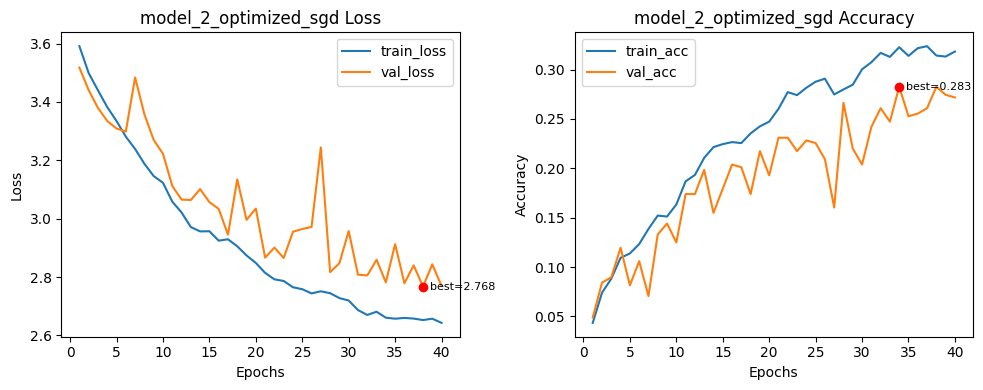

Best val_loss: 2.7676 at epoch 38
Best val_acc : 0.2826 at epoch 34


In [ ]:
plot_curves(optimized_history_sgd, title= "model_2_optimized_sgd")

**NOTE:** As we can see again by the numbers and plots, we can understand a significant improvement in both training and validation accuracy by reaching the 28% val accuracy from 17% by the previous model.

## Evaluating SGD

Evaluating the model that trained with SGD optimizer over the test dataset to check their accuracy and compare to other models.  

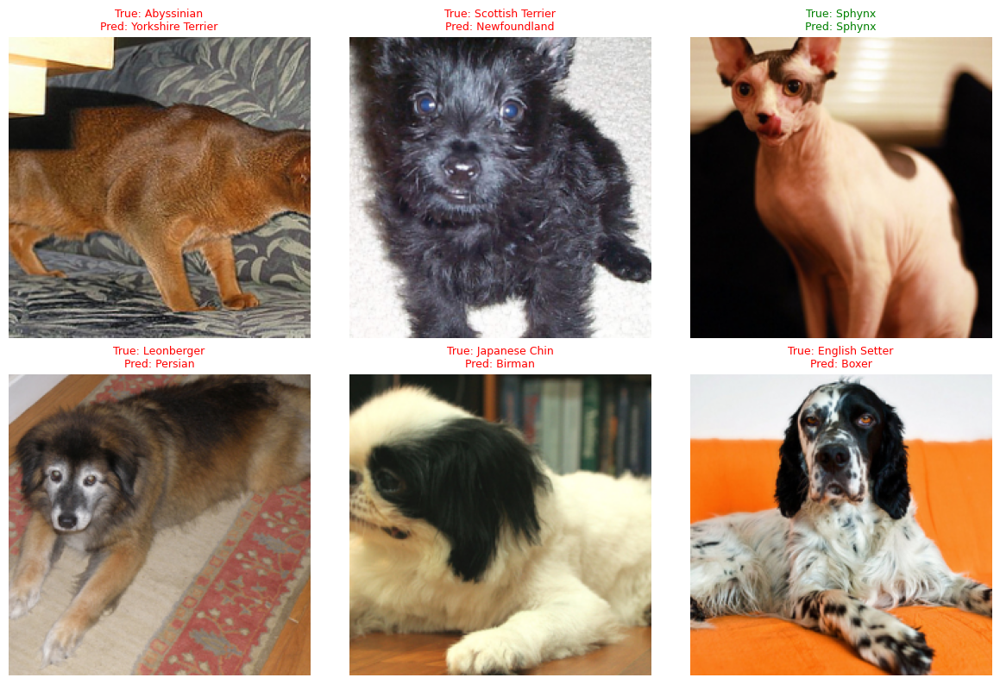

Optimized CNN with SGD Optimizer and Learning Rate = 0.01 --> Test loss: 2.5490, Test accuracy: 27.72%


In [ ]:
loss_fn = nn.CrossEntropyLoss()
test_loss_sgd, test_acc_sgd = evaluate(optimized_model_sgd, test_loader, loss_fn, device, show_examples=True, class_names=dataset_all.classes, num_examples=6, inv_norm=inv_norm)
print(f"Optimized CNN with SGD Optimizer and Learning Rate = 0.01 --> Test loss: {test_loss_sgd:.4f}, Test accuracy: {test_acc_sgd * 100:.2f}%")

**NOTE:** The test accuracy reached 27% from 14% by the previous model which again shows improvement. Also we can understand this better by watching some examples from the test set with their True and Predicted labels.  

In [ ]:
# Save the test acc and loss to compare all models in the end
results = {}
results["test_accuracy"] = round(test_acc_sgd *100, 2)
results["test_loss"] = round(test_loss_sgd, 3)

all_models["model_2_optimized_sgd"] = results

### Optimized CNN Training (Adam Optimizer)

We decided to change some hyperparameters to improve the accuracy and reduce the loss amount. In this step we try to training with Adamw optimizer and 1e-4 learning rate.


In [ ]:
EPOCHS = 40
LR = 1e-4
WEIGHT_DECAY = 1e-4
PATIENCE = 7
USE_AMP = torch.cuda.is_available()
GRAD_CLIP = 1.0

def run_training_optimized_adam(model, epochs=EPOCHS, lr=LR, save_name=None):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=WEIGHT_DECAY)

    # OneCycleLR: needs steps_per_epoch
    steps_per_epoch = len(train_loader)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=lr*10, epochs=epochs, steps_per_epoch=steps_per_epoch,
        pct_start=0.1, div_factor=10.0, final_div_factor=100.0
    )

    scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_acc, best_state, patience = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        t0 = time.time()
        # ---- train ----
        model.train()
        run_loss = 0.0
        run_correct = 0
        n = 0
        for imgs, labels in train_loader:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=USE_AMP):
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)

            scaler.scale(loss).backward()
            if GRAD_CLIP:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            bs = imgs.size(0)
            run_loss += loss.item() * bs
            run_correct += (outputs.argmax(1) == labels).sum().item()
            n += bs

        train_loss = run_loss / n
        train_acc = run_correct / n

        # ---- val ----
        model.eval()
        v_loss = 0.0
        v_correct = 0
        v_n = 0
        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)
                bs = imgs.size(0)
                v_loss += loss.item() * bs
                v_correct += (outputs.argmax(1) == labels).sum().item()
                v_n += bs
        val_loss = v_loss / v_n
        val_acc = v_correct / v_n

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)

        improved = val_acc > best_val_acc + 1e-4
        if improved:
            best_val_acc = val_acc
            patience = 0
            best_state = {k: v.detach().cpu() for k, v in model.state_dict().items()}
            if save_name:
                torch.save(best_state, save_name)
        else:
            patience += 1

        print(f"[CNN-Adam] Epoch {epoch}/{epochs}  time {(time.time()-t0):.1f}s  "
              f"train_loss {train_loss:.4f} train_acc {train_acc:.4f}  "
              f"val_loss {val_loss:.4f} val_acc {val_acc:.4f}  "
              f"{'(best)' if improved else ''}")

        if patience >= PATIENCE:
            print(f"Early stopping (best val_acc={best_val_acc:.4f})")
            break

    if best_state:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})
    return model, history, best_val_acc


In [ ]:
optimized_model_adam = OptimizedPetCNN(num_classes=NUM_CLASSES, base_channels=64,dropout=0.3)
optimized_model_adam, optimized_history_adam, optimized_val_acc_adam = run_training_optimized_adam(
    optimized_model_adam, save_name="optimized_cnn_adam.pt"
)
print(f"Best val accuracy: {optimized_val_acc_adam * 100:.2f}%")

[CNN-Adam] Epoch 1/40  time 24.9s  train_loss 3.5695 train_acc 0.0506  val_loss 3.4788 val_acc 0.1005  (best)
[CNN-Adam] Epoch 2/40  time 24.6s  train_loss 3.4719 train_acc 0.0761  val_loss 3.3918 val_acc 0.1005  
[CNN-Adam] Epoch 3/40  time 22.6s  train_loss 3.4044 train_acc 0.0965  val_loss 3.3747 val_acc 0.1141  (best)
[CNN-Adam] Epoch 4/40  time 21.4s  train_loss 3.3568 train_acc 0.1084  val_loss 3.5539 val_acc 0.0625  
[CNN-Adam] Epoch 5/40  time 22.1s  train_loss 3.2454 train_acc 0.1342  val_loss 3.2323 val_acc 0.1359  (best)
[CNN-Adam] Epoch 6/40  time 22.8s  train_loss 3.1380 train_acc 0.1532  val_loss 3.3130 val_acc 0.0924  
[CNN-Adam] Epoch 7/40  time 22.6s  train_loss 3.0526 train_acc 0.1800  val_loss 3.1214 val_acc 0.1929  (best)
[CNN-Adam] Epoch 8/40  time 22.1s  train_loss 2.9737 train_acc 0.2055  val_loss 3.0473 val_acc 0.1739  
[CNN-Adam] Epoch 9/40  time 22.8s  train_loss 2.9341 train_acc 0.2204  val_loss 3.0149 val_acc 0.2065  (best)
[CNN-Adam] Epoch 10/40  time 22.6s

**!NOTE:** As we can see the best validation accuracy raised from 28% to 47% over 40 epochs training in this step by changing the optimizer from **SGD** to **Adam** and also changing the learning rate.

## Visualizing the plots

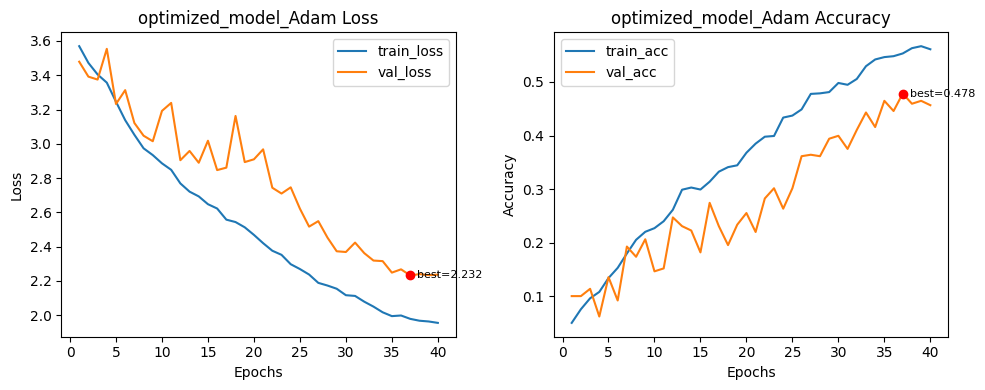

Best val_loss: 2.2319 at epoch 37
Best val_acc : 0.4783 at epoch 37


In [ ]:
plot_curves(optimized_history_adam, title= "optimized_model_Adam")

## Evaluating

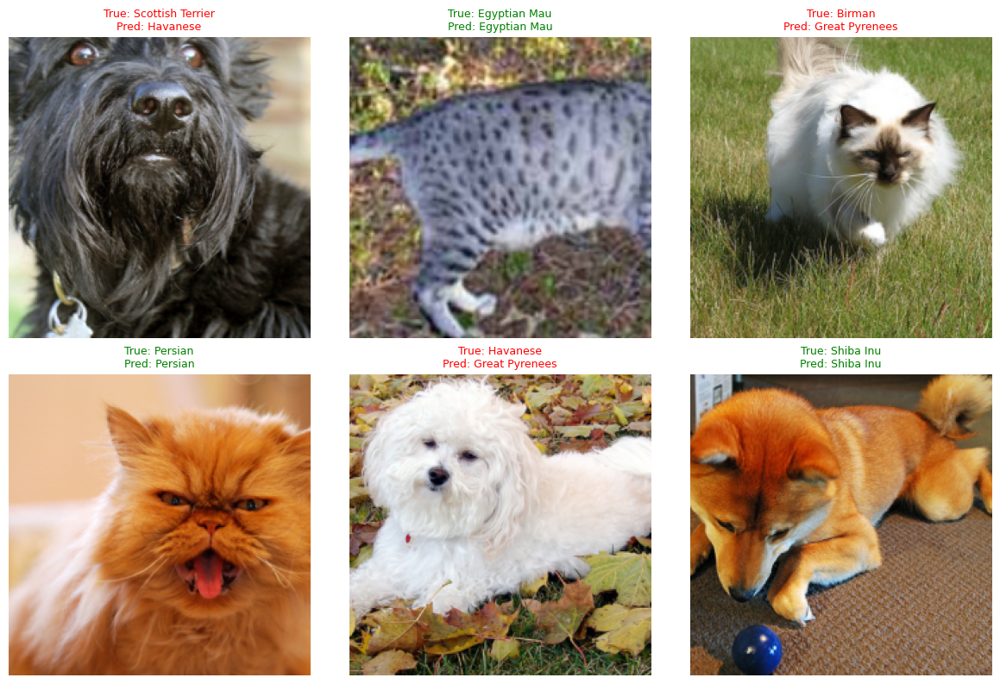


Optimized CNN with Adam Optimizer and Learning Rate = 0.0001 --> Test loss: 1.7827, Test accuracy: 47.28%


In [ ]:
loss_fn = nn.CrossEntropyLoss()
test_loss_adam, test_acc_adam = evaluate(optimized_model_adam, test_loader, loss_fn, device, show_examples= True, class_names= dataset_all.classes, num_examples= 6, inv_norm= inv_norm)
print(f"\nOptimized CNN with Adam Optimizer and Learning Rate = 0.0001 --> Test loss: {test_loss_adam:.4f}, Test accuracy: {test_acc_adam * 100:.2f}%")

**!NOTE:** It is clear that we improved the accuracy over test set by **47%** with respect to previous model with 25%. And also it's more understandable by looking at the examples.

In [ ]:
# Save the test acc and loss to compare all models in the end
results = {}
results["test_accuracy"] = round(test_acc_adam * 100, 2)
results["test_loss"] = round(test_loss_adam, 2)

all_models["model_2_optimized_adam"] = results

### Optimized CNN Training (AdamW Optimizer)

For having a better accuracy and less loss again we changed the optimizer and also the learning. For this step we use **AdamW** optimizer with 0.0003 learning rate, but all the other hyperparameters are the same as we used for Adam.


In [ ]:
EPOCHS = 50
LR = 3e-4
WEIGHT_DECAY = 1e-4
PATIENCE = 7
USE_AMP = torch.cuda.is_available()
GRAD_CLIP = 1.0

def run_training_optimized_adamw(model, epochs=EPOCHS, lr=LR, save_name=None):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=WEIGHT_DECAY)

    # OneCycleLR: needs steps_per_epoch
    steps_per_epoch = len(train_loader)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=lr*10, epochs=epochs, steps_per_epoch=steps_per_epoch,
        pct_start=0.1, div_factor=10.0, final_div_factor=100.0
    )

    scaler = torch.cuda.amp.GradScaler(enabled=USE_AMP)

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_acc, best_state, patience = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        t0 = time.time()
        # ---- train ----
        model.train()
        run_loss = 0.0
        run_correct = 0
        n = 0
        for imgs, labels in train_loader:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=USE_AMP):
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)

            scaler.scale(loss).backward()
            if GRAD_CLIP:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            bs = imgs.size(0)
            run_loss += loss.item() * bs
            run_correct += (outputs.argmax(1) == labels).sum().item()
            n += bs

        train_loss = run_loss / n
        train_acc = run_correct / n

        # ---- val ----
        model.eval()
        v_loss = 0.0
        v_correct = 0
        v_n = 0
        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)
                bs = imgs.size(0)
                v_loss += loss.item() * bs
                v_correct += (outputs.argmax(1) == labels).sum().item()
                v_n += bs
        val_loss = v_loss / v_n
        val_acc = v_correct / v_n

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_acc'].append(train_acc)
        history['val_acc'].append(val_acc)

        improved = val_acc > best_val_acc + 1e-4
        if improved:
            best_val_acc = val_acc
            patience = 0
            best_state = {k: v.detach().cpu() for k, v in model.state_dict().items()}
            if save_name:
                torch.save(best_state, save_name)
        else:
            patience += 1

        print(f"[CNN-AdamW] Epoch {epoch}/{epochs}  time {(time.time()-t0):.1f}s  "
              f"train_loss {train_loss:.4f} train_acc {train_acc:.4f}  "
              f"val_loss {val_loss:.4f} val_acc {val_acc:.4f}  "
              f"{'(best)' if improved else ''}")

        if patience >= PATIENCE:
            print(f"Early stopping (best val_acc={best_val_acc:.4f})")
            break

    if best_state:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})
    return model, history, best_val_acc


## Training and Validation loop

Now we train a model from optimized CNN architecture to see the results and compare them with other models.

In [ ]:
optimized_model_adamw = OptimizedPetCNN(num_classes=NUM_CLASSES, base_channels=64,dropout=0.3)
optimized_model_adamw, optimized_history_adamw, optimized_val_acc_adamw = run_training_optimized_adamw(
    optimized_model_adamw, save_name="optimized_cnn_adamw.pt"
)
print(f"Best val accuracy: {optimized_val_acc_adamw * 100:.2f}%")

[CNN-AdamW] Epoch 1/50  time 23.1s  train_loss 3.5570 train_acc 0.0601  val_loss 3.4579 val_acc 0.0842  (best)
[CNN-AdamW] Epoch 2/50  time 22.3s  train_loss 3.4644 train_acc 0.0795  val_loss 3.4055 val_acc 0.0897  (best)
[CNN-AdamW] Epoch 3/50  time 23.5s  train_loss 3.4046 train_acc 0.0931  val_loss 3.5499 val_acc 0.0489  
[CNN-AdamW] Epoch 4/50  time 23.5s  train_loss 3.3386 train_acc 0.1084  val_loss 3.4283 val_acc 0.0815  
[CNN-AdamW] Epoch 5/50  time 22.8s  train_loss 3.2450 train_acc 0.1372  val_loss 3.3137 val_acc 0.1033  (best)
[CNN-AdamW] Epoch 6/50  time 21.8s  train_loss 3.1952 train_acc 0.1342  val_loss 3.1769 val_acc 0.1304  (best)
[CNN-AdamW] Epoch 7/50  time 22.7s  train_loss 3.1015 train_acc 0.1678  val_loss 3.2774 val_acc 0.0978  
[CNN-AdamW] Epoch 8/50  time 23.1s  train_loss 3.0316 train_acc 0.1824  val_loss 3.0801 val_acc 0.1630  (best)
[CNN-AdamW] Epoch 9/50  time 22.5s  train_loss 2.9599 train_acc 0.2079  val_loss 3.3015 val_acc 0.1304  
[CNN-AdamW] Epoch 10/50  

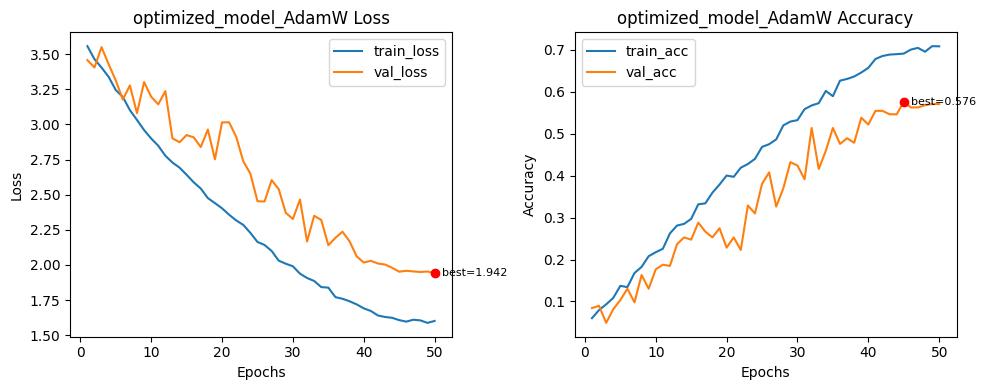

Best val_loss: 1.9418 at epoch 50
Best val_acc : 0.5761 at epoch 45


In [ ]:
plot_curves(optimized_history_adamw, title= "optimized_model_AdamW")

**!NOTE:** As we can see the numbers in the epochs and also the plots we can understand the significant improvement with this model. Reaching 57% val accuracy with 50 epochs training.

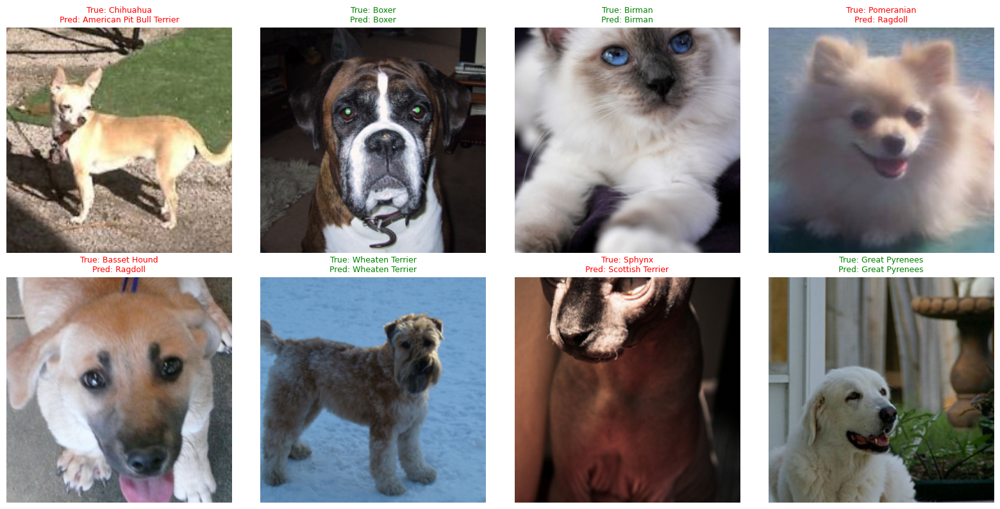


Optimized CNN with AdamW Optimizer and Learning Rate = 0.0003 --> Test loss: 1.3924, Test accuracy: 56.79%


In [ ]:
loss_fn = nn.CrossEntropyLoss()
test_loss_adamw, test_acc_adamw = evaluate(optimized_model_adamw, test_loader, loss_fn, device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"\nOptimized CNN with AdamW Optimizer and Learning Rate = 0.0003 --> Test loss: {test_loss_adamw:.4f}, Test accuracy: {test_acc_adamw * 100:.2f}%")

**!NOTE:** A very acceptable test accuracy **(56%)** by this model. So we also try to use this model's hyperparameters later for the ResNet model also.

In [ ]:
# Save the test acc and loss to compare all models in the end
results = {}
results["test_accuracy"] = round(test_acc_adamw * 100, 2)
results["test_loss"] = round(test_loss_adamw, 3)

all_models["model_2_optimized_adamw"] = results

In [ ]:
all_models

{'model_1_base_adam': {'test_accuracy': 14.13, 'test_loss': 3.183},
 'model_2_optimized_sgd': {'test_accuracy': 27.72, 'test_loss': 2.549},
 'model_2_optimized_adam': {'test_accuracy': 47.28, 'test_loss': 1.78},
 'model_2_optimized_adamw': {'test_accuracy': 56.79, 'test_loss': 1.392}}

## Comparing the models and visualize the comparison

Now we try to compare the test results for each model to better understand the improvement.

In [ ]:
df = pd.DataFrame.from_dict(all_models, orient="index")
df

,test_accuracy,test_loss
model_1_base_adam,14.13,3.183
model_2_optimized_sgd,27.72,2.549
model_2_optimized_adam,47.28,1.780
model_2_optimized_adamw,56.79,1.392


In [ ]:
# Adding also the validation values to the dict to plot and compare them
val_accuracy = {
    "model_1_base_adam": 17.66,
    "model_2_optimized_sgd": 28.26,
    "model_2_optimized_adam": 47.83,
    "model_2_optimized_adamw": 57.61,
}

val_loss = {
    "model_1_base_adam": 3.22,
    "model_2_optimized_sgd": 2.767,
    "model_2_optimized_adam": 2.231,
    "model_2_optimized_adamw": 1.941,
}

In [ ]:
df["val_accuracy"] = df.index.map(val_accuracy)
df["val_loss"] = df.index.map(val_loss)

In [ ]:
df

,test_accuracy,test_loss,val_accuracy,val_loss
model_1_base_adam,14.13,3.183,17.66,3.220
model_2_optimized_sgd,27.72,2.549,28.26,2.767
model_2_optimized_adam,47.28,1.780,47.83,2.231
model_2_optimized_adamw,56.79,1.392,57.61,1.941


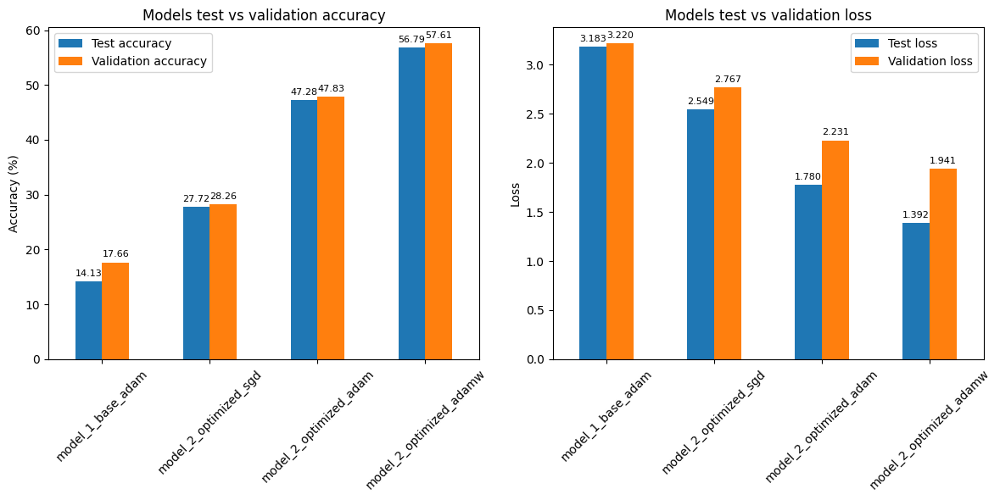

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# --- Left: accuracy (test + val) ---
ax_acc = df[["test_accuracy", "val_accuracy"]].plot(
    kind="bar",
    ax=axes[0],
    rot=45
)
ax_acc.set_ylabel("Accuracy (%)")
ax_acc.set_title("CNN Models test vs validation accuracy")
ax_acc.legend(["Test accuracy", "Validation accuracy"])

for container in ax_acc.containers:
    ax_acc.bar_label(container, fmt="%.2f", padding=3, fontsize=8)

# --- Right: loss (test + val) ---
ax_loss = df[["test_loss", "val_loss"]].plot(
    kind="bar",
    ax=axes[1],
    rot=45
)
ax_loss.set_ylabel("Loss")
ax_loss.set_title("CNN Models test vs validation loss")
ax_loss.legend(["Test loss", "Validation loss"])

for container in ax_loss.containers:
    ax_loss.bar_label(container, fmt="%.3f", padding=3, fontsize=8)

plt.tight_layout()
plt.show()


# Part 2

### PART 2A: ResNet-18 Fine-Tuning (Same Hyperparameters as the best CNN model)

This cell loads a pretrained ResNet-18 model and replaces its final fully connected layer to match the number of classes in the Pet dataset.


In [ ]:
# Prepare resnet
# Load ResNet-18 pretrained on ImageNet
def get_model():
  model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
  model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
  return model.to(device)

In [ ]:
model1_resnet = get_model()
summary(model1_resnet, input_size=(3, 224, 224), device=str(device))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 189MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

[CNN-AdamW] Epoch 1/50  time 22.3s  train_loss 1.7780 train_acc 0.6681  val_loss 1.2808 val_acc 0.7880  (best)
[CNN-AdamW] Epoch 2/50  time 23.1s  train_loss 1.1481 train_acc 0.8570  val_loss 2.0447 val_acc 0.5326  
[CNN-AdamW] Epoch 3/50  time 20.3s  train_loss 1.4446 train_acc 0.7415  val_loss 3.0722 val_acc 0.3533  
[CNN-AdamW] Epoch 4/50  time 21.1s  train_loss 1.6197 train_acc 0.6776  val_loss 3.4277 val_acc 0.2418  
[CNN-AdamW] Epoch 5/50  time 21.0s  train_loss 1.6738 train_acc 0.6702  val_loss 2.5275 val_acc 0.4103  
[CNN-AdamW] Epoch 6/50  time 20.1s  train_loss 1.5839 train_acc 0.7058  val_loss 1.9991 val_acc 0.5571  
[CNN-AdamW] Epoch 7/50  time 22.2s  train_loss 1.4680 train_acc 0.7456  val_loss 2.3282 val_acc 0.5027  
[CNN-AdamW] Epoch 8/50  time 21.1s  train_loss 1.3819 train_acc 0.7683  val_loss 2.0530 val_acc 0.5408  
Early stopping (best val_acc=0.7880)
ResNet best val: 78.8


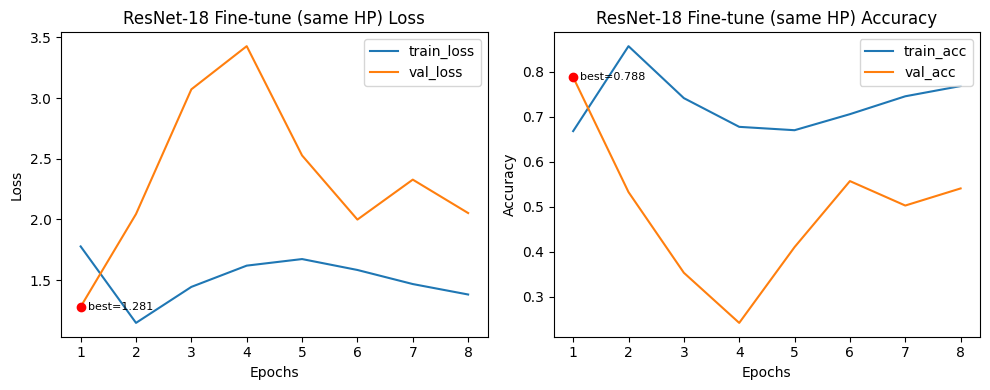

Best val_loss: 1.2808 at epoch 1
Best val_acc : 0.7880 at epoch 1


In [ ]:
# Train with same hyperparams as baseline
model1_resnet, model1_resnet_hist, model1_resnet_val_acc = run_training_optimized_adamw(model1_resnet, epochs=50, lr=3e-4, save_name="resnet_ft_samehp.pt")
print("ResNet best val:", round(model1_resnet_val_acc *100, 2))
plot_curves(model1_resnet_hist, title="ResNet-18 Fine-tune (same HP)")


**!NOTE:**

In part 2A, we fine-tuned ResNet-18 using exactly the same hyperparameters as our best CNN model (AdamW, lr=3e-4, OneCycleLR, etc.), as required. This produced a strong validation accuracy in the first epoch (~78%), but subsequent epochs degraded performance, likely because these hyperparameters are too aggressive for full fine-tuning of a pretrained backbone.

### Model_1_ResNet Test Evaluation

This cell evaluates the fine-tuned ResNet-18 model on the test dataset using cross-entropy loss. It computes the final test loss and test accuracy.


In [ ]:
inv_norm = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225],
)


model1_test_loss, model1_test_acc = evaluate(model1_resnet, test_loader, nn.CrossEntropyLoss(), device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"ResNet test loss: {model1_test_loss:.2f} and test acc: {model1_test_acc * 100:.2f}%")

ResNet test loss: 0.75 and test acc: 80.71%


**Conclusion:** **80%** test accuracy for the ResNet-18 model with the same hyperparameters as the best CNN model. Works well but needs improvement.

In [ ]:
resnet_all_models = {}

In [ ]:
# Save all the values for different models to compare them at the end
results = {}
results["test_accuracy"] = round(model1_test_acc * 100, 2)
results["test_loss"] = round(model1_test_loss, 3)
results["val_accuracy"] = round(model1_resnet_val_acc * 100, 2)
results["val_loss"] = 1.281

resnet_all_models["model1_resnet"] = results

### PART 2B: Tweaking the hyperparameters and image size

This cell prepares a new data pipeline for Part 2B. It redefines the image transforms to use 224×224 inputs, stronger data augmentation for training (resize, random resized crop, horizontal flip, and heavier color jitter), and a simple resize + normalization for validation and test images. Using the same train/validation/test indices as in Part 1, it rebuilds the datasets and dataloaders (with a smaller batch size of 32 to fit ResNet-18 in memory). These “*_big” loaders are then used in the following cells to train ResNet-18 with different hyperparameters and to compare performance against the baseline setup.



In [ ]:
# Experiment: larger input size (224), different augmentation, optimizer, learning rate schedule
IMG_SIZE = 224
# recreate transforms and dataloaders with larger size
# Training transform: resize → crop → flip → color jitter → normalize
train_transform_big = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8,1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(0.3,0.3,0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

# Validation/Test transforms: no augmentation, just resize + normalize
test_transform_big = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])

# Dataset splits with new transforms
# Use same indices as original split, but new transforms
train_dataset_big = Subset(TransformDataset(dataset_all, transform=train_transform_big), train_idx.indices)
val_dataset_big   = Subset(TransformDataset(dataset_all, transform=test_transform_big), val_idx.indices)
test_dataset_big  = Subset(TransformDataset(dataset_all, transform=test_transform_big), test_idx.indices)
# Batch size=32 for ResNet because larger images use more memory
train_loader_big = DataLoader(train_dataset_big, batch_size=32, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader_big   = DataLoader(val_dataset_big,   batch_size=32, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader_big  = DataLoader(test_dataset_big,  batch_size=32, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

## Model 2:
In Model2 we want to check the accuracy again with the same hyperparameters of the best CNN model but this time with different datasets which the transformation and resizes are a bit different from CNN datasets which we also checked for the Model_1_Resnet. If the accuracy goes up we will continue with this transformation for ResNet, if not we use the previous transformation.

In [ ]:
def run_training_resnet_adamw(
    model: nn.Module,
    train_loader,
    val_loader,
    device,
    epochs: int = None,
    lr: float = None,
    weight_decay: float = 1e-4,
    patience: int = 7,
    use_amp: bool | None = None,
    grad_clip: float | None = 1.0,
    loss_fn: nn.Module | None = None,
    save_name: str | None = None,
):
    """
    Training loop for ResNet-18 with AdamW + OneCycleLR, AMP and gradient clipping.

    Args:
        model:        PyTorch model to train.
        train_loader: DataLoader for training data.
        val_loader:   DataLoader for validation data.
        device:       torch.device ("cuda" or "cpu").
        epochs:       Max number of epochs to train.
        lr:           Base learning rate for AdamW.
        weight_decay: L2 regularization (same as CNN: 1e-4).
        patience:     Early stopping patience (epochs without val_acc improvement).
        use_amp:      If None, use torch.cuda.is_available(). Mixed precision if True.
        grad_clip:    Max gradient norm (e.g. 1.0). If None, no clipping.
        loss_fn:      Loss function (default: CrossEntropy + label smoothing).
        save_name:    If not None, path to save best model weights.

    Returns:
        model:         Model with best validation weights loaded.
        history:       Dict with train/val loss & accuracy curves.
        best_val_acc:  Best validation accuracy achieved.
    """
    model = model.to(device)

    if loss_fn is None:
        loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)

    if use_amp is None:
        use_amp = torch.cuda.is_available()

    optimizer = optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay,
    )

    steps_per_epoch = len(train_loader)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=lr * 10,
        epochs=epochs,
        steps_per_epoch=steps_per_epoch,
        pct_start=0.1,
        div_factor=10.0,
        final_div_factor=100.0,
    )

    scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_acc = 0.0
    best_state = None
    epochs_without_improve = 0

    for epoch in range(1, epochs + 1):
        t0 = time.time()

        # ----- Train -----
        model.train()
        running_loss = 0.0
        running_corrects = 0
        n = 0

        for imgs, labels in train_loader:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=use_amp):
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)

            scaler.scale(loss).backward()

            if grad_clip is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)

            scaler.step(optimizer)
            scaler.update()
            scheduler.step()

            bs = imgs.size(0)
            running_loss += loss.item() * bs
            running_corrects += (outputs.argmax(1) == labels).sum().item()
            n += bs

        train_loss = running_loss / n
        train_acc = running_corrects / n

        # ----- Validation -----
        model.eval()
        val_loss = 0.0
        val_corrects = 0
        m = 0

        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)

                outputs = model(imgs)
                loss_val = loss_fn(outputs, labels)

                bs = imgs.size(0)
                val_loss += loss_val.item() * bs
                val_corrects += (outputs.argmax(1) == labels).sum().item()
                m += bs

        val_loss = val_loss / m
        val_acc = val_corrects / m

        # ----- Log metrics -----
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        # ----- Early stopping on val_acc -----
        improved = val_acc > best_val_acc + 1e-4
        if improved:
            best_val_acc = val_acc
            epochs_without_improve = 0
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
            if save_name is not None:
                torch.save(best_state, save_name)
        else:
            epochs_without_improve += 1

        elapsed = time.time() - t0
        print(
            f"[ResNet-18 AdamW] Epoch {epoch}/{epochs}  time {elapsed:.1f}s  "
            f"train_loss {train_loss:.4f} train_acc {train_acc:.4f}  "
            f"val_loss {val_loss:.4f} val_acc {val_acc:.4f}  "
            f"{'(best)' if improved else ''}"
        )

        if epochs_without_improve >= patience:
            print(f"Early stopping: no improvement in val_acc for {patience} epochs.")
            break

    # Load best weights (if any)
    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    print(f"Best validation accuracy: {best_val_acc * 100:.2f}%")
    return model, history, best_val_acc


[ResNet-18 AdamW] Epoch 1/50  time 25.1s  train_loss 1.3677 train_acc 0.6505  val_loss 1.1666 val_acc 0.6440  (best)
[ResNet-18 AdamW] Epoch 2/50  time 24.9s  train_loss 0.9114 train_acc 0.7269  val_loss 4.1406 val_acc 0.2364  
[ResNet-18 AdamW] Epoch 3/50  time 24.8s  train_loss 1.4531 train_acc 0.5652  val_loss 2.3182 val_acc 0.3859  
[ResNet-18 AdamW] Epoch 4/50  time 25.2s  train_loss 1.7152 train_acc 0.4908  val_loss 5.1358 val_acc 0.2011  
[ResNet-18 AdamW] Epoch 5/50  time 24.9s  train_loss 1.7558 train_acc 0.4932  val_loss 2.8605 val_acc 0.2582  
[ResNet-18 AdamW] Epoch 6/50  time 24.7s  train_loss 1.6066 train_acc 0.5336  val_loss 2.6570 val_acc 0.4212  
[ResNet-18 AdamW] Epoch 7/50  time 25.5s  train_loss 1.3731 train_acc 0.5887  val_loss 3.0813 val_acc 0.3179  
[ResNet-18 AdamW] Epoch 8/50  time 24.9s  train_loss 1.1998 train_acc 0.6332  val_loss 2.1163 val_acc 0.4402  
Early stopping: no improvement in val_acc for 7 epochs.
Best validation accuracy: 64.40%


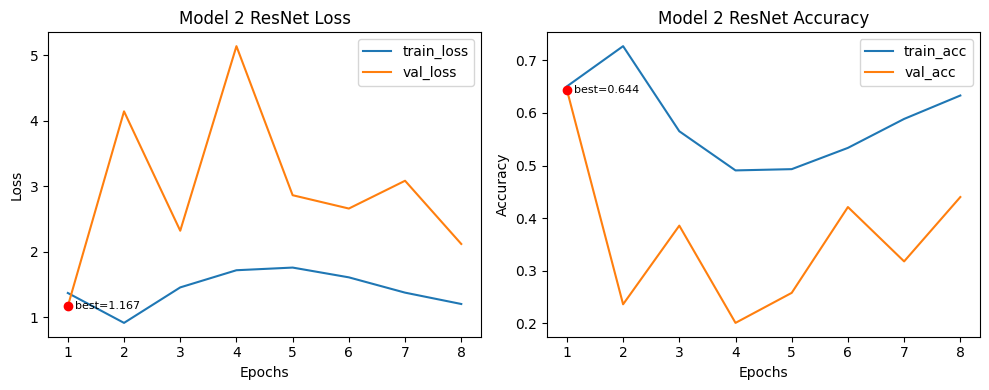

Best val_loss: 1.1666 at epoch 1
Best val_acc : 0.6440 at epoch 1


In [ ]:
LR = 3e-4
EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
model2_resnet = get_model()

model2_resnet, model2_resnet_history, model2_best_val_acc = run_training_resnet_adamw(
    model=model2_resnet,
    train_loader=train_loader_big,
    val_loader=val_loader_big,
    device=device,
    epochs=EPOCHS,
    lr=LR,
    weight_decay=1e-4,
    use_amp= False,
    loss_fn= loss_fn,
    save_name="resnet_model2.pt",
    patience= 7
)

plot_curves(model2_resnet_history, title="Model 2 ResNet")

**Conclusion:** As we see, the model could not train and show better val accuracy rather than the model_1_resnet with only **64%** validation accuracy. This shows that the model was working better with the previous transformation on images.

### Model2 ResNet Test Evaluation

This cell evaluates the improved ResNet-18 model on the test set using cross-entropy loss. It reports the final test loss and accuracy, allowing you to measure how well the optimized ResNet generalizes to unseen data.


In [ ]:
model2_test_loss, model2_test_acc = evaluate(model2_resnet, test_loader_big, nn.CrossEntropyLoss(), device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"The evaluation results for the Model2 ResNet:\n test loss: {model2_test_loss:.3f} test acc: {model2_test_acc * 100:.2f}%")


The evaluation results for the Model2 ResNet:
 test loss: 1.161 test acc: 66.30%


**!NOTE:** We can simply see that exactly with the same hyperparameters but with a little bit different transformation the test accuracy reduced around **14%**. So we use the previous transformation for the next model and change other hyperparameters to have improvements on test accuracy.

In [ ]:
# Save all the values for different models to compare them at the end
results = {}
results["test_accuracy"] = round(model2_test_acc * 100, 2)
results["test_loss"] = round(model2_test_loss, 3)
results["val_accuracy"] = round(model2_best_val_acc * 100, 2)
results["val_loss"] = 1.166

resnet_all_models["model2_resnet"] = results

## Model 3

After watching no imrpovement in model 2, we have to change some hyperparameters to get better results. In Model3 We try to change the learning rate and check the model's accuracy over test set.

* We lower the lr to 1e-4
* Remove the schedular from the loop

**Reference:** https://www.tensorflow.org/tutorials/images/transfer_learning?hl=en

In [ ]:
def run_training_resnet_adamw_v2(
    model: nn.Module,
    train_loader,
    val_loader,
    device,
    epochs: int = 50,
    lr: float = None,
    weight_decay: float = 1e-4,
    patience: int = None,
    use_amp: bool | None = None,
    grad_clip: float | None = 1.0,
    loss_fn: nn.Module | None = None,
    save_name: str | None = None,
):
    """
    Training loop for ResNet-18 with AdamW + OneCycleLR, AMP and gradient clipping.

    Args:
        model:        PyTorch model to train.
        train_loader: DataLoader for training data.
        val_loader:   DataLoader for validation data.
        device:       torch.device ("cuda" or "cpu").
        epochs:       Max number of epochs to train.
        lr:           Base learning rate for AdamW.
        weight_decay: L2 regularization (same as CNN: 1e-4).
        patience:     Early stopping patience (epochs without val_acc improvement).
        use_amp:      If None, use torch.cuda.is_available(). Mixed precision if True.
        grad_clip:    Max gradient norm (e.g. 1.0). If None, no clipping.
        loss_fn:      Loss function (default: CrossEntropy + label smoothing).
        save_name:    If not None, path to save best model weights.

    Returns:
        model:         Model with best validation weights loaded.
        history:       Dict with train/val loss & accuracy curves.
        best_val_acc:  Best validation accuracy achieved.
    """
    model = model.to(device)

    if loss_fn is None:
        loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)

    if use_amp is None:
        use_amp = torch.cuda.is_available()

    optimizer = optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay,
    )

    scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    best_val_acc = 0.0
    best_state = None
    epochs_without_improve = 0

    for epoch in range(1, epochs + 1):
        t0 = time.time()

        # ----- Train -----
        model.train()
        running_loss = 0.0
        running_corrects = 0
        n = 0

        for imgs, labels in train_loader:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(enabled=use_amp):
                outputs = model(imgs)
                loss = loss_fn(outputs, labels)

            scaler.scale(loss).backward()

            # gradient clipping (same idea as in your CNN loop)
            if grad_clip is not None:
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)

            scaler.step(optimizer)
            scaler.update()

            bs = imgs.size(0)
            running_loss += loss.item() * bs
            running_corrects += (outputs.argmax(1) == labels).sum().item()
            n += bs

        train_loss = running_loss / n
        train_acc = running_corrects / n

        # ----- Validation -----
        model.eval()
        val_loss = 0.0
        val_corrects = 0
        m = 0

        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs = imgs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)

                outputs = model(imgs)
                loss_val = loss_fn(outputs, labels)

                bs = imgs.size(0)
                val_loss += loss_val.item() * bs
                val_corrects += (outputs.argmax(1) == labels).sum().item()
                m += bs

        val_loss = val_loss / m
        val_acc = val_corrects / m

        # ----- Log metrics -----
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        # ----- Early stopping on val_acc -----
        improved = val_acc > best_val_acc + 1e-4
        if improved:
            best_val_acc = val_acc
            epochs_without_improve = 0
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
            if save_name is not None:
                torch.save(best_state, save_name)
        else:
            epochs_without_improve += 1

        elapsed = time.time() - t0
        print(
            f"[ResNet-18 AdamW] Epoch {epoch}/{epochs}  time {elapsed:.1f}s  "
            f"train_loss {train_loss:.4f} train_acc {train_acc:.4f}  "
            f"val_loss {val_loss:.4f} val_acc {val_acc:.4f}  "
            f"{'(best)' if improved else ''}"
        )

        if epochs_without_improve >= patience:
            print(f"Early stopping: no improvement in val_acc for {patience} epochs.")
            break

    # Load best weights (if any)
    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    print(f"Best validation accuracy: {best_val_acc * 100:.2f}%")
    return model, history, best_val_acc


[ResNet-18 AdamW] Epoch 1/50  time 22.1s  train_loss 3.6110 train_acc 0.0652  val_loss 3.3591 val_acc 0.1196  (best)
[ResNet-18 AdamW] Epoch 2/50  time 21.6s  train_loss 3.0783 train_acc 0.2374  val_loss 2.8626 val_acc 0.3261  (best)
[ResNet-18 AdamW] Epoch 3/50  time 20.5s  train_loss 2.5946 train_acc 0.4742  val_loss 2.3923 val_acc 0.5598  (best)
[ResNet-18 AdamW] Epoch 4/50  time 21.7s  train_loss 2.1624 train_acc 0.6549  val_loss 1.9728 val_acc 0.6821  (best)
[ResNet-18 AdamW] Epoch 5/50  time 21.5s  train_loss 1.7867 train_acc 0.7673  val_loss 1.6533 val_acc 0.7609  (best)
[ResNet-18 AdamW] Epoch 6/50  time 20.6s  train_loss 1.4961 train_acc 0.8257  val_loss 1.3915 val_acc 0.8043  (best)
[ResNet-18 AdamW] Epoch 7/50  time 21.9s  train_loss 1.2595 train_acc 0.8638  val_loss 1.1892 val_acc 0.8342  (best)
[ResNet-18 AdamW] Epoch 8/50  time 21.2s  train_loss 1.0797 train_acc 0.8825  val_loss 1.0404 val_acc 0.8750  (best)
[ResNet-18 AdamW] Epoch 9/50  time 21.0s  train_loss 0.9328 trai

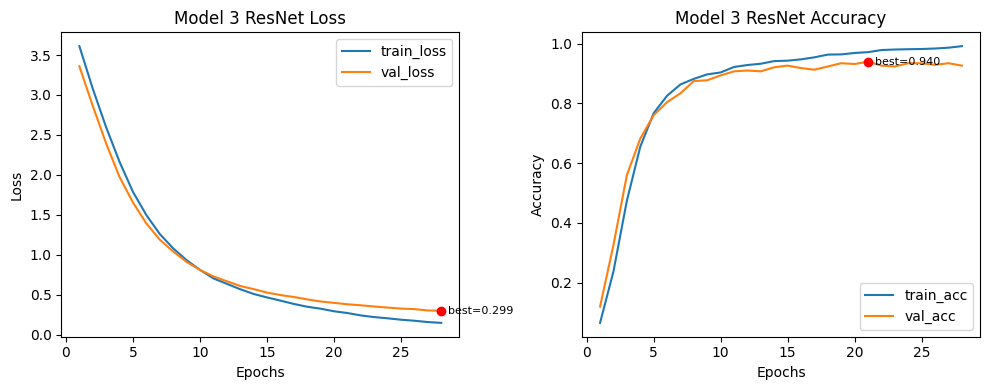

Best val_loss: 0.2991 at epoch 28
Best val_acc : 0.9402 at epoch 21


In [ ]:
LR3 = 1e-5
EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()
model3_resnet = get_model()

model3_resnet, model3_resnet_history, model3_best_val_acc = run_training_resnet_adamw_v2(
    model=model3_resnet,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=EPOCHS,
    lr=LR3,
    weight_decay=1e-4,
    use_amp= True,
    loss_fn= loss_fn,
    save_name="resnet_model3.pt",
    patience= 7
)

plot_curves(model3_resnet_history, title="Model 3 ResNet")

**!NOTE:** The model trained very well and reached the **94%** validation accuracy. So by just reducing the learning rate to 1e-5 and removing the schedular ,as the reference also metioned this point, we got a signifant improvement in our finetuning step.

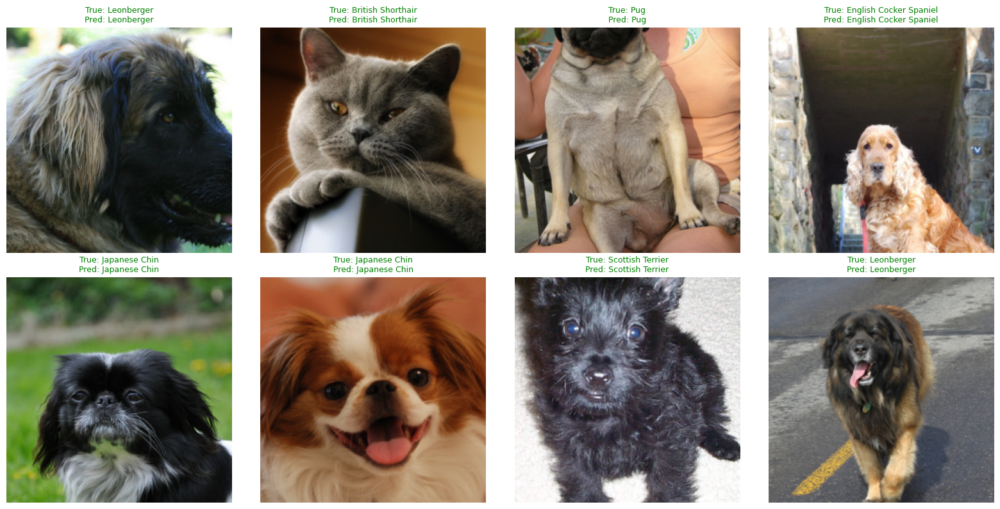

The evaluation results for the Model3 ResNet:
 test loss: 0.437 test acc: 90.22%


In [ ]:
model3_test_loss, model3_test_acc = evaluate(model3_resnet, test_loader, nn.CrossEntropyLoss(), device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"The evaluation results for the Model3 ResNet:\n test loss: {model3_test_loss:.3f} test acc: {model3_test_acc * 100:.2f}%")

**!CONCLUSION:** So far the Model 3 with **90%** test accuracy is the best model that we could trained!!

In [ ]:
# Save all the values for different models to compare them at the end
results = {}
results["test_accuracy"] = round(model3_test_acc * 100, 2)
results["test_loss"] = round(model3_test_loss, 3)
results["val_accuracy"] = round(model3_best_val_acc * 100, 2)
results["val_loss"] = 0.299

resnet_all_models["model3_resnet"] = results

## Model 4 ( Freezing Layers except the final FC layer)

So far we fine tuned the whole layers of the ResNet-18. This time, we change the approach and freeze the weights and biases of all layers except the final fully connected (FC) layer to see whether training only the last layer can improve the accuracy.

**Reference:** https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

In [ ]:
model4_resnet = get_model()

for name, param in model4_resnet.named_parameters():
    if 'fc' in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

### Training and Validation loop over Model 4

In [ ]:
LR3 = 1e-5
EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()

model4_resnet, model4_resnet_history, model4_best_val_acc = run_training_resnet_adamw_v2(
    model=model4_resnet,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=EPOCHS,
    lr=LR3,
    weight_decay=1e-4,
    use_amp= True,
    loss_fn= loss_fn,
    save_name="resnet_model4.pt",
    patience= 7
)

[ResNet-18 AdamW] Epoch 1/50  time 21.1s  train_loss 3.8593 train_acc 0.0306  val_loss 3.7574 val_acc 0.0245  (best)
[ResNet-18 AdamW] Epoch 2/50  time 19.8s  train_loss 3.7988 train_acc 0.0323  val_loss 3.7007 val_acc 0.0245  
[ResNet-18 AdamW] Epoch 3/50  time 20.3s  train_loss 3.7425 train_acc 0.0418  val_loss 3.6516 val_acc 0.0299  (best)
[ResNet-18 AdamW] Epoch 4/50  time 20.2s  train_loss 3.6786 train_acc 0.0472  val_loss 3.6029 val_acc 0.0353  (best)
[ResNet-18 AdamW] Epoch 5/50  time 19.9s  train_loss 3.6266 train_acc 0.0513  val_loss 3.5609 val_acc 0.0435  (best)
[ResNet-18 AdamW] Epoch 6/50  time 20.4s  train_loss 3.5814 train_acc 0.0540  val_loss 3.5191 val_acc 0.0598  (best)
[ResNet-18 AdamW] Epoch 7/50  time 19.5s  train_loss 3.5400 train_acc 0.0679  val_loss 3.4809 val_acc 0.0652  (best)
[ResNet-18 AdamW] Epoch 8/50  time 20.7s  train_loss 3.4914 train_acc 0.0703  val_loss 3.4392 val_acc 0.0815  (best)
[ResNet-18 AdamW] Epoch 9/50  time 19.5s  train_loss 3.4507 train_acc 

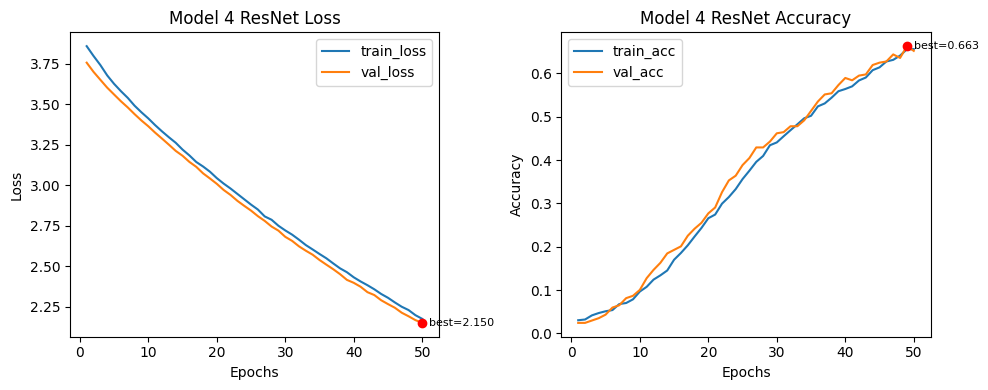

Best val_loss: 2.1505 at epoch 50
Best val_acc : 0.6630 at epoch 49


In [ ]:
plot_curves(model4_resnet_history, title="Model 4 ResNet")

**Conclusion:** It's clear that after 50 epochs the model could not reach an acceptable accuracy over validation set by just **66%**. We can understand that maybe either the learning rate is too low for this model or the number of epochs are not sufficient. Therfore, for the next model (model_5) we try to raise the learning to check the difference.

### Accuracy and Loss of Model 4 on test set

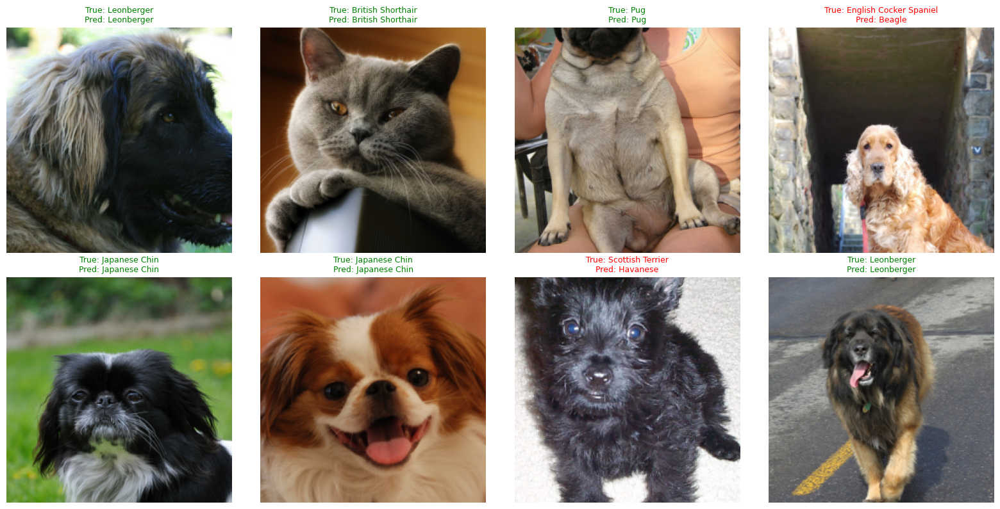

The evaluation results for the Model3 ResNet:
 test loss: 2.146 test acc: 64.13%


In [ ]:
# inverse normalization for ImageNet stats
inv_norm = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225],
)

model4_test_loss, model4_test_acc = evaluate(model4_resnet, test_loader, nn.CrossEntropyLoss(), device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"The evaluation results for the Model3 ResNet:\n test loss: {model4_test_loss:.3f} test acc: {model4_test_acc * 100:.2f}%")

**Conclusion:** As we expected the model could not reach even 65% accuracy over test set.

In [ ]:
# Save all the values for different models to compare them at the end
results = {}
results["test_accuracy"] = round(model4_test_acc * 100, 2)
results["test_loss"] = round(model4_test_loss, 3)
results["val_accuracy"] = round(model4_best_val_acc * 100, 2)
results["val_loss"] = 2.111

resnet_all_models["model4_resnet"] = results

## Model 5

Like we said earlier for the model_4, in this model we want to raise the learning rate value and see the training epochs and validation accuracy and compare it with the previous models. (lr: 1e-5 --> 1e-4)

In [ ]:
model5_resnet = get_model()

for name, param in model5_resnet.named_parameters():
    if 'fc' in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

In [ ]:
LR4 = 1e-4
EPOCHS = 50

loss_fn = nn.CrossEntropyLoss()

model5_resnet, model5_resnet_history, model5_best_val_acc = run_training_resnet_adamw_v2(
    model=model5_resnet,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=EPOCHS,
    lr=LR4,
    weight_decay=1e-4,
    use_amp= True,
    loss_fn= loss_fn,
    save_name="resnet_model5.pt",
    patience= 7
)

[ResNet-18 AdamW] Epoch 1/50  time 19.7s  train_loss 3.5678 train_acc 0.0788  val_loss 3.2890 val_acc 0.1467  (best)
[ResNet-18 AdamW] Epoch 2/50  time 21.1s  train_loss 3.1640 train_acc 0.2052  val_loss 2.9297 val_acc 0.3315  (best)
[ResNet-18 AdamW] Epoch 3/50  time 19.7s  train_loss 2.8289 train_acc 0.3794  val_loss 2.6121 val_acc 0.4973  (best)
[ResNet-18 AdamW] Epoch 4/50  time 21.2s  train_loss 2.5202 train_acc 0.5306  val_loss 2.3254 val_acc 0.6087  (best)
[ResNet-18 AdamW] Epoch 5/50  time 19.6s  train_loss 2.2576 train_acc 0.6328  val_loss 2.0828 val_acc 0.6902  (best)
[ResNet-18 AdamW] Epoch 6/50  time 20.9s  train_loss 2.0305 train_acc 0.7052  val_loss 1.8720 val_acc 0.7446  (best)
[ResNet-18 AdamW] Epoch 7/50  time 20.2s  train_loss 1.8246 train_acc 0.7626  val_loss 1.6767 val_acc 0.7853  (best)
[ResNet-18 AdamW] Epoch 8/50  time 20.1s  train_loss 1.6436 train_acc 0.8020  val_loss 1.5146 val_acc 0.8043  (best)
[ResNet-18 AdamW] Epoch 9/50  time 20.4s  train_loss 1.4870 trai

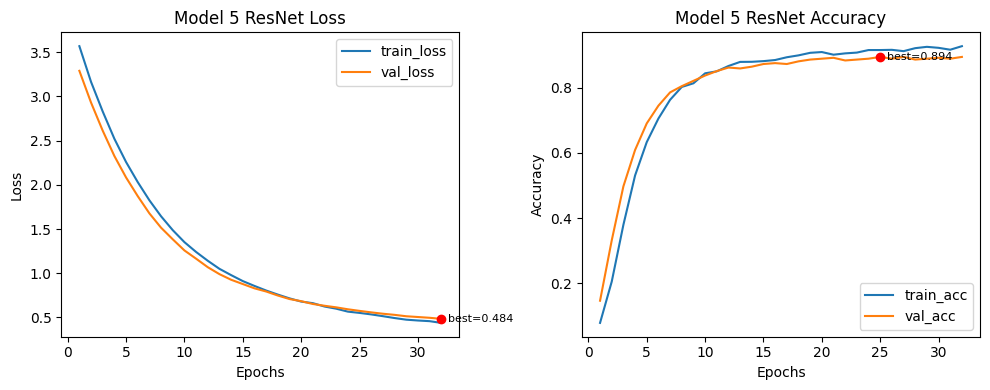

Best val_loss: 0.4837 at epoch 32
Best val_acc : 0.8940 at epoch 25


In [ ]:
plot_curves(model5_resnet_history, title="Model 5 ResNet")

**Conclusion:** Huge improvement but still could not beat the model_3 with **89%** validation accuracy.

## Accuracy and Loss of model_5 over test set

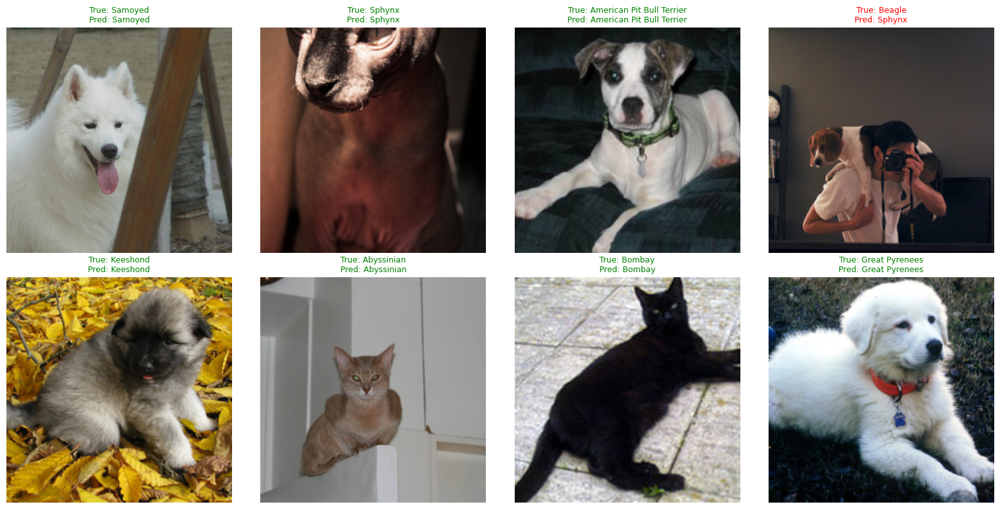

The evaluation results for the Model3 ResNet:
 test loss: 0.569 test acc: 91.30%


In [ ]:
model5_test_loss, model5_test_acc = evaluate(model5_resnet, test_loader, nn.CrossEntropyLoss(), device, show_examples= True, class_names= dataset_all.classes, num_examples= 8, inv_norm= inv_norm)
print(f"The evaluation results for the Model3 ResNet:\n test loss: {model5_test_loss:.3f} test acc: {model5_test_acc * 100:.2f}%")

**Conclusion:** A strange result but very interesting. This model with **91%** test accuracy could even go through the model_3 test accuracy with **90%** although did not have better validation accuracy after 32 epochs. We can consider this model as our best ResNet model among these 5 Models.

In [ ]:
# Save all the values for different models to compare them at the end
results = {}
results["test_accuracy"] = round(model5_test_acc * 100, 2)
results["test_loss"] = round(model5_test_loss, 3)
results["val_accuracy"] = round(model5_best_val_acc * 100, 2)
results["val_loss"] = 0.483

resnet_all_models["model5_resnet"] = results

## Plotting all the ResNet models values to compare them all in one

In [ ]:
df_resnet = pd.DataFrame.from_dict(resnet_all_models, orient="index")

In [ ]:
df_resnet

,test_accuracy,test_loss,val_accuracy,val_loss
model1_resnet,80.71,0.752,78.80,1.281
model2_resnet,66.30,1.161,64.40,1.166
model3_resnet,90.22,0.437,94.02,0.299
model4_resnet,64.13,2.146,66.30,2.150
model5_resnet,91.30,0.569,89.40,0.483


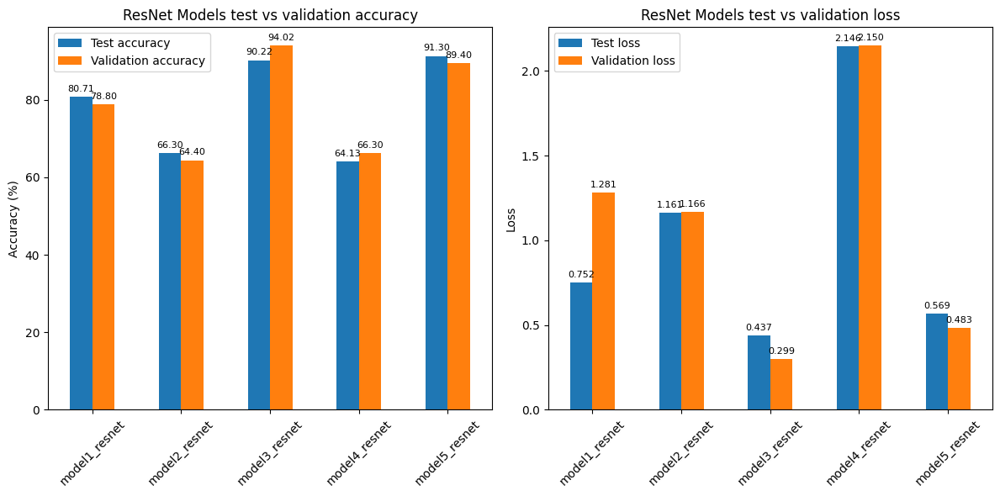

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

ax_acc = df_resnet[["test_accuracy", "val_accuracy"]].plot(
    kind="bar",
    ax=axes[0],
    rot=45
)
ax_acc.set_ylabel("Accuracy (%)")
ax_acc.set_title("ResNet Models test vs validation accuracy")
ax_acc.legend(["Test accuracy", "Validation accuracy"])

for container in ax_acc.containers:
    ax_acc.bar_label(container, fmt="%.2f", padding=3, fontsize=8)

ax_loss = df_resnet[["test_loss", "val_loss"]].plot(
    kind="bar",
    ax=axes[1],
    rot=45
)
ax_loss.set_ylabel("Loss")
ax_loss.set_title("ResNet Models test vs validation loss")
ax_loss.legend(["Test loss", "Validation loss"])

for container in ax_loss.containers:
    ax_loss.bar_label(container, fmt="%.3f", padding=3, fontsize=8)

plt.tight_layout()
plt.show()

**Final Word:** From these experiments, we learned that when fine-tuning all layers of a pretrained model like ResNet-18, it is usually better to use a lower learning rate and fewer epochs, so we don’t “confuse” the pretrained features and destabilize training. In contrast, when we freeze all layers except the final fully connected (FC) layer, we can safely use a higher learning rate and more epochs, since we are only training a small part of the network, which often still leads to good performance.